In [1]:
import scanpy as sc
import anndata as ad
import numpy as np
import glob

In [ ]:
new_path = "/media/desk16/iy66914/JZF"
os.chdir(new_path)
adata = sc.read_h5ad("./adata_cluster.h5ad")

In [15]:
import os

current_path = os.getcwd()
print("当前路径:", current_path) 

当前路径: /home/jpc/JZF


In [3]:
adata = sc.read_h5ad("./adata_cluster.h5ad")

In [4]:
s_genes = [
    "MCM5", "PCNA", "TYMS", "FEN1", "MCM2", "MCM4", "RRM1",
    "UNG", "GINS2", "MCM6", "CDCA7", "DTL", "PRIM1", "UHRF1",
    "HELLS", "RFC2", "RPA2", "NASP", "RAD51AP1", "GMNN", "WDR76",
    "SLBP", "CCNE2", "UBR7", "POLD3", "MSH2", "ATAD2", "RAD51",
    "RRM2", "CDC45", "CDC6", "EXO1", "TIPIN", "DSCC1", "BLM",
    "CASP8AP2", "USP1", "CLSPN", "POLA1", "CHAF1B", "BRIP1", "E2F8"
]

g2m_genes = [
    "HMGB2", "CDK1", "NUSAP1", "UBE2C", "BIRC5", "TPX2", "TOP2A", "NDC80",
    "CKS2", "NUF2", "CKS1B", "MKI67", "TMPO", "CENPF", "TACC3", "SMC4",
    "CCNB2", "CKAP2L", "CKAP2", "AURKB", "BUB1", "KIF11", "ANP32E", "TUBB4B",
    "GTSE1", "KIF20B", "HJURP", "CDCA3", "CDC20", "TTK", "CDC25C", "KIF2C",
    "RANGAP1", "NCAPD2", "DLGAP5", "CDCA2", "CDCA8", "ECT2", "KIF23", "HMMR",
    "AURKA", "PSRC1", "ANLN", "LBR", "CKAP5", "CENPE", "CTCF", "NEK2",
    "G2E3", "GAS2L3", "CBX5", "CENPA"
]


# 细胞周期评估
#sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

In [5]:
sc.tl.pca(adata,n_comps=50)

In [106]:
adata

AnnData object with n_obs × n_vars = 157988 × 25365
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden_res_0.20', 'leiden_res_0.40', 'leiden_res_0.60', 'leiden_res_0.80', 'leiden_res_1.00', 'leiden_res_1.20', 'leiden_res_1.40', 'leiden_res_1.60', 'leiden_res_1.80', 'leiden_res_2.00', 'S_score', 'G2M_score', 'phase', 'leiden'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches',

In [9]:
adata.obs["leiden"] = adata.obs["leiden_res_0.60"]

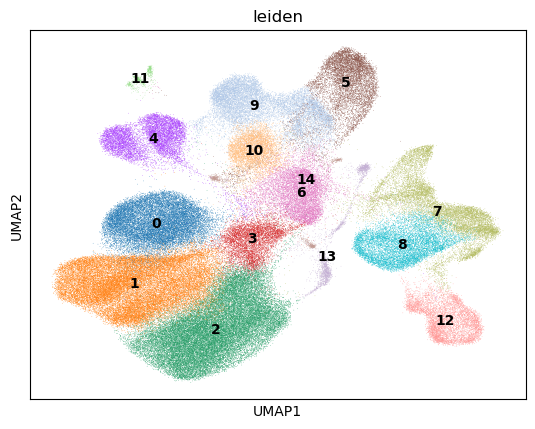

In [10]:
sc.pl.umap(
    adata,
    color=["leiden"],
    legend_loc="on data",
)

In [11]:
adata

AnnData object with n_obs × n_vars = 157988 × 25365
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden_res_0.20', 'leiden_res_0.40', 'leiden_res_0.60', 'leiden_res_0.80', 'leiden_res_1.00', 'leiden_res_1.20', 'leiden_res_1.40', 'leiden_res_1.60', 'leiden_res_1.80', 'leiden_res_2.00', 'S_score', 'G2M_score', 'phase', 'leiden'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches',

In [12]:
import scipy.sparse as sparse
import scipy.io as sio
import scipy.stats as stats
import os

In [13]:
umap_df = adata.obs.copy()
umap_df[['UMAP1', 'UMAP2']] = adata.obsm['X_umap']
umap_df.head()

,sample,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,...,leiden_res_1.40,leiden_res_1.60,leiden_res_1.80,leiden_res_2.00,S_score,G2M_score,phase,leiden,UMAP1,UMAP2
CELL1_N2,HTJT,1246,7.128496,2641.0,7.879292,26.656569,38.394548,51.419917,71.753124,65.0,...,0,0,0,0,0.003318,0.019487,G2M,0,-1.816806,6.479633
CELL2_N2,HTJT,2520,7.832411,7083.0,8.865594,31.342651,39.248906,48.722293,64.097134,102.0,...,4,1,2,2,-0.005169,-0.084757,G1,5,6.411479,13.060095
CELL8_N3,HTJT,1268,7.145984,3866.0,8.260234,36.575272,51.733057,65.028453,80.134506,86.0,...,5,2,3,3,-0.029017,-0.067922,G1,2,-0.799031,-1.514131
CELL10_N2,HTJT,1288,7.161622,3901.0,8.269244,35.324276,50.499872,63.342733,79.800051,32.0,...,0,0,0,0,-0.026305,-0.013071,G1,0,-2.251410,6.279605
CELL11_N2,HTJT,1467,7.291656,4106.0,8.320448,32.951778,45.372625,57.866537,74.963468,38.0,...,7,6,8,9,-0.023555,-0.034693,G1,1,-2.954329,2.252396


In [14]:
umap_df.columns

Index(['sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts',
       'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes',
       'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes',
       'pct_counts_in_top_500_genes', 'total_counts_mt',
       'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo',
       'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb',
       'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score',
       'predicted_doublet', 'leiden_res_0.20', 'leiden_res_0.40',
       'leiden_res_0.60', 'leiden_res_0.80', 'leiden_res_1.00',
       'leiden_res_1.20', 'leiden_res_1.40', 'leiden_res_1.60',
       'leiden_res_1.80', 'leiden_res_2.00', 'S_score', 'G2M_score', 'phase',
       'leiden', 'UMAP1', 'UMAP2'],
      dtype='object')

In [16]:
#geneinfo=all_data.var
#mtx=all_data.X.T
umap_df.to_csv("./umap_df.csv")
#sio.mmwrite("/home/jpc/ICI/GSE229353/data/sparse_matrix.mtx",mtx)

In [42]:
marker_genes = { 
  "Immu": ["PTPRC"],
  "Mast cells":["TPSAB1","CPA3","MS4A2"],
  "ILC":["KIT","KLRF1","IL7R"],
  #"Cell Cycle" :["TOP2A","MKI67"],
  "Monocyte":["CD68","FCGR3A","CD14","MARCO"],
  "B cells":["CD79A","CD79B","CD19","MS4A1"],
  "Plasma cells":["JCHAIN","IGKC"],
 # "platelets":["PF4", "PPBP"], #,"GP9"
  "T cells":["CD3D","CD3E","CD3G"],
  "CD4+ T cells":["CD4"],
  "CD8+ T cells":["CD8A","CD8B"],
  "NK" :["NKG7","KLRG1","KLRC1"],
    "Myeloid":["CD14", "LYZ", "S100A8", "FCGR3A"],
  "DC":["CD1C","LAMP3"] ,
    "Macro":["CD68","LYZ","MSR1","CD163","MRC1"],
  "Neu":["FCGR3B","CXCR2","SLC25A37","G0S2","CXCR1","ADGRG3"],
    "Epi": ["EPCAM", "KRT18",  "KRT19"],
    "Fibroblasts": ["PDGFRA", "PDGFRB", "COL1A1", "COL1A2", "DCN", "FAP"], #, "LUM"
    "Myofibroblasts": ["ACTA2", "TAGLN", "MYH11"],
    "Endo": ["PECAM1", "VWF", "CDH5", "ENG", "TIE1", "CLDN5"],
    "Pericytes": ["RGS5", "PDGFRB", "CSPG4", "MCAM", "ACTA2"]
}

In [17]:
marker_genes = { 
  "Myofibroblast": ["MYL9","MYH11"],
  "Cholangiocyte":["EPCAM", "KRT7",  "KRT19"],
  "HSC":["COL1A1", "COL3A1", "DCN"],
  "Hepatocyte" :["APOC3","HP","ALB"],
     "Mast cells":["TPSAB1","CPA3","MS4A2"],
  "Endothelial":["PECAM1","CDH5", "TIE1", "CLDN5"],
  #"Macro/mono":["CD79A","CD79B","CD19","MS4A1"],
  "Myeloid": ["CD14","MS4A7","FCGR3A"],
  "Neutrophil":["C1QA","G0S2"],
    "B cells":["CD79A","CD79B","CD19","MS4A1"],
     "Plasma cells":["IGKC","JCHAIN","MZB1"],
    "T cell":["CD3D","CD3E","CD3G"],
     "NK" :["NKG7","KLRG1","KLRC1"]}

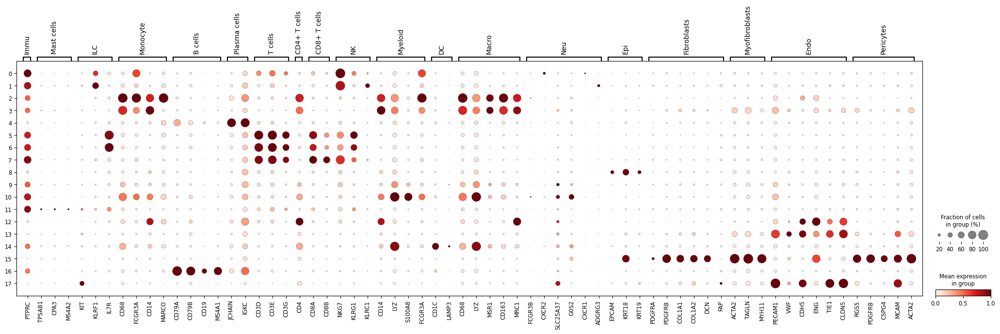

In [43]:
sc.pl.dotplot(adata_filtered, marker_genes, groupby="leiden_res_1.00", standard_scale="var")

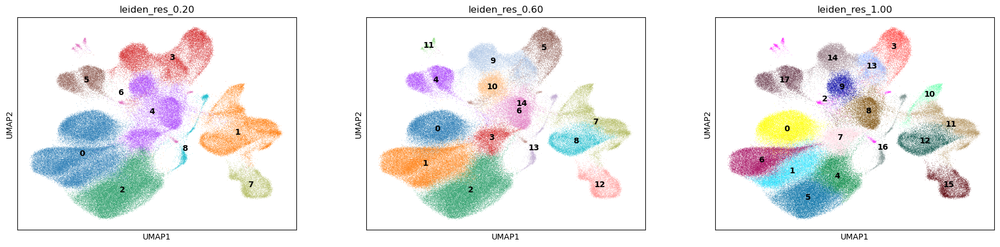

In [21]:
sc.pl.umap(
    adata,
    color=["leiden_res_0.20", "leiden_res_0.60", "leiden_res_1.00"],
    legend_loc="on data",
)

In [22]:
adata_1 = adata.copy()

KeyboardInterrupt: 

In [28]:
#adata_filtered = adata[adata.obs["predicted_doublet"] == 'False'].copy()
adata_filtered = adata[adata.obs["predicted_doublet"] == False].copy()


In [27]:
adata.obs["predicted_doublet"].unique()

array([False,  True])

In [ ]:
adata_filtered

In [30]:
import bbknn

# 1. 使用 BBKNN 整合邻接图（基于 harmony 的输出）
sc.external.pp.bbknn(adata_filtered, batch_key='sample')
sc.tl.umap(adata_filtered)
for res in np.arange(0.2, 2.01, 0.2):
    sc.tl.leiden(
        adata_filtered, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )

In [56]:
sc.tl.umap( adata_filtered, 
    min_dist=0.3,  
gamma=1.5)

In [57]:
sc.tl.leiden(
        adata_filtered, resolution=1.00, flavor="igraph" )


In [62]:
adata_filtered.obs.keys()

Index(['sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts',
       'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes',
       'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes',
       'pct_counts_in_top_500_genes', 'total_counts_mt',
       'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo',
       'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb',
       'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score',
       'predicted_doublet', 'leiden_res_0.20', 'leiden_res_0.40',
       'leiden_res_0.60', 'leiden_res_0.80', 'leiden_res_1.00',
       'leiden_res_1.20', 'leiden_res_1.40', 'leiden_res_1.60',
       'leiden_res_1.80', 'leiden_res_2.00', 'S_score', 'G2M_score', 'phase',
       'leiden', 'cell_type'],
      dtype='object')

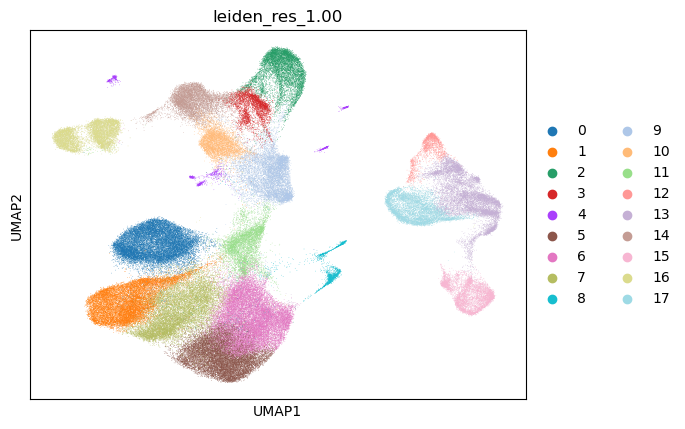

In [63]:
sc.pl.umap(adata_filtered, color=["leiden_res_1.00"])

/home/jpc/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 25972 (\N{CJK UNIFIED IDEOGRAPH-6574}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/jpc/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 21512 (\N{CJK UNIFIED IDEOGRAPH-5408}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/jpc/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 25928 (\N{CJK UNIFIED IDEOGRAPH-6548}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/jpc/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 26524 (\N{CJK UNIFIED IDEOGRAPH-679C}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


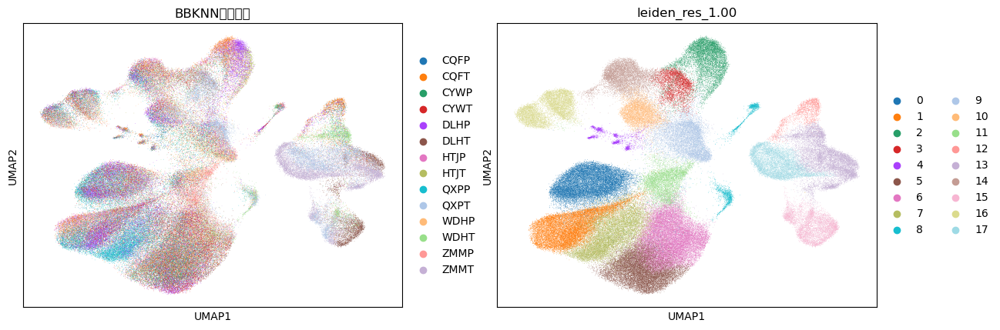

In [31]:
sc.pl.umap(adata_filtered, color=["sample", "leiden_res_1.00"], title="BBKNN整合效果")

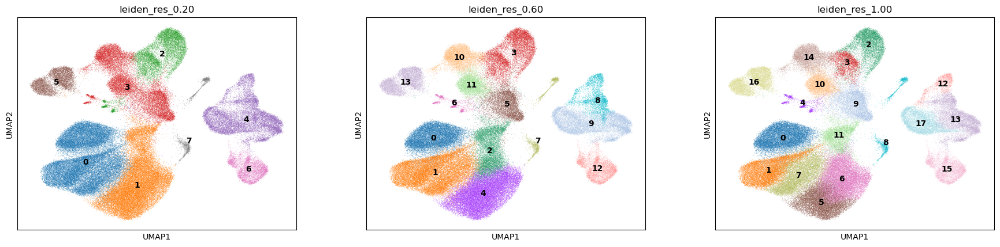

In [36]:
sc.pl.umap(
    adata_filtered,
    color=["leiden_res_0.20", "leiden_res_0.60", "leiden_res_1.00"],
    legend_loc="on data",
)

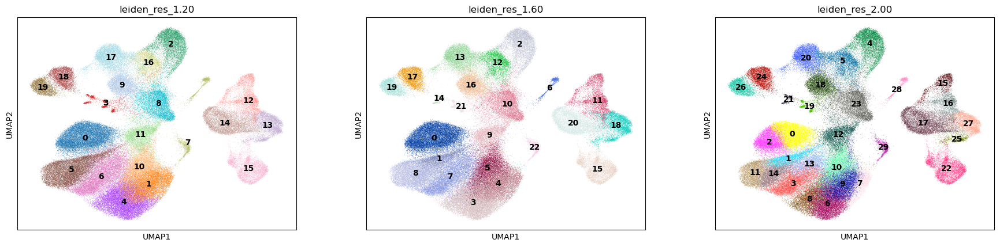

In [47]:
sc.pl.umap(
    adata_filtered,
    color=["leiden_res_1.20", "leiden_res_1.60", "leiden_res_2.00"],
    legend_loc="on data",
)

In [ ]:
sc.pl.umap(
    adata_filtered,
    color=["leiden_res_0.20", "leiden_res_0.60", "leiden_res_1.00"],
    legend_loc="on data",
)

In [44]:
adata_filtered.obs["cell_type"] = adata_filtered.obs["leiden_res_1.00"].map(
    {
        "0": "NK",
        "1": "ILC",
        "2": "Myeloid cells",
        "3": "Myeloid cells",
        "4": "Plasma",
        "5": "T cells",
        "6": "T cells",
        "7": "T cells",
        "8": "Epi",
        "9": "Myeloid cells",
        "10": "Myeloid cells",
        "11": "Mast cells",
        "12": "Endo",
        "13": "Endo",
        "14": "Myeloid cells",
        "15": "Fibroblast",
        "16": "B cells",
        "17": "Endo"
    }
)

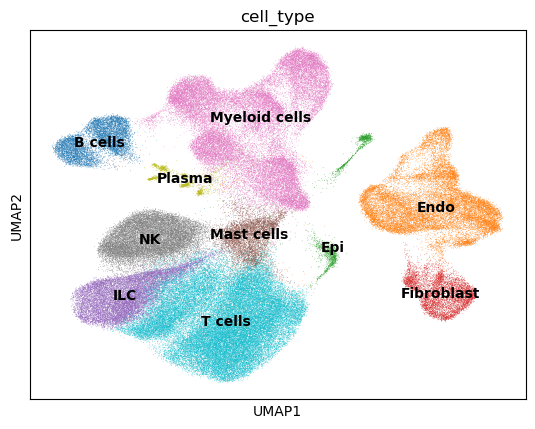

In [45]:
sc.pl.umap(
    adata_filtered,
    color=["cell_type"],
    legend_loc="on data",
)

In [54]:
adata_filtered.write("./adata_major.h5ad")

In [107]:
umap_df = adata_filtered.obs.copy()
umap_df[['UMAP1', 'UMAP2']] = adata_filtered.obsm['X_umap']
umap_df.head()

,sample,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,...,leiden_res_1.60,leiden_res_1.80,leiden_res_2.00,S_score,G2M_score,phase,leiden,cell_type,UMAP1,UMAP2
CELL1_N2,HTJT,1246,7.128496,2641.0,7.879292,26.656569,38.394548,51.419917,71.753124,65.0,...,0,0,0,0.003318,0.019487,G2M,0,NK,-2.217170,2.510282
CELL2_N2,HTJT,2520,7.832411,7083.0,8.865594,31.342651,39.248906,48.722293,64.097134,102.0,...,2,2,4,-0.005169,-0.084757,G1,2,Myeloid cells,3.883457,15.020568
CELL8_N3,HTJT,1268,7.145984,3866.0,8.260234,36.575272,51.733057,65.028453,80.134506,86.0,...,3,4,6,-0.029017,-0.067922,G1,5,T cells,0.038008,-3.330939
CELL10_N2,HTJT,1288,7.161622,3901.0,8.269244,35.324276,50.499872,63.342733,79.800051,32.0,...,0,0,0,-0.026305,-0.013071,G1,0,NK,-2.426940,2.405307
CELL11_N2,HTJT,1467,7.291656,4106.0,8.320448,32.951778,45.372625,57.866537,74.963468,38.0,...,1,9,1,-0.023555,-0.034693,G1,1,ILC,-3.417546,0.639842


In [108]:
umap_df.to_csv("./cellinfo.csv")

In [52]:
celltype_markers = {
    "Hepatocyte": [
        "ALB",     # Albumin
        #"TAT",     # Tyrosine aminotransferase
        "CYP3A4",  # Cytochrome P450 family
        "HP",      # Haptoglobin
        "TF",      # Transferrin
        "APOA1"    # Apolipoprotein A1
    ],
    "Cholangiocyte": [
        "KRT19",   # Cytokeratin 19
        "SOX9",    # Transcription factor
        "EPCAM",   # Epithelial marker
        "ANXA4",   # Annexin A4
        "CFTR"     # Cystic fibrosis transmembrane regulator
    ],
    "Hepatoblast": [
      #  "DLK1",    # Delta like non-canonical Notch ligand 1
        "AFP",     # Alpha fetoprotein
        "KRT8",    # Early epithelial marker
        "PROM1",   # CD133
        "EPCAM",   # Shared with cholangiocyte but higher in progenitors
        "CD24"     # Stem/progenitor marker
    ]
}


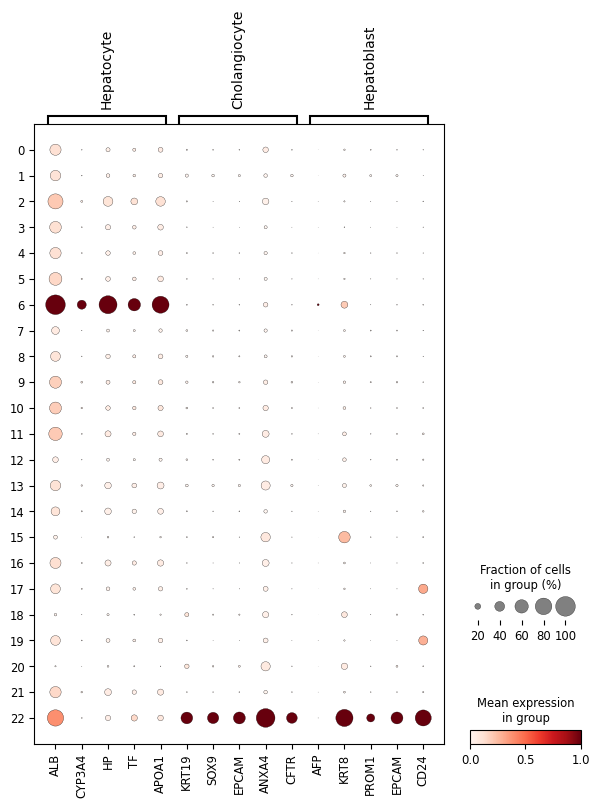

In [53]:
sc.pl.dotplot(adata_filtered, celltype_markers, groupby="leiden_res_1.60", standard_scale="var")

In [76]:
adata_T = adata_filtered[adata_filtered.obs["cell_type"] == "T cells"].copy()

In [232]:
adata_B = adata_filtered[adata_filtered.obs["cell_type"] == "B cells"].copy()

In [251]:
adata_Endo = adata_filtered[adata_filtered.obs["cell_type"] == "Endo"].copy()

In [252]:
adata_Endo

AnnData object with n_obs × n_vars = 19510 × 25365
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden_res_0.20', 'leiden_res_0.40', 'leiden_res_0.60', 'leiden_res_0.80', 'leiden_res_1.00', 'leiden_res_1.20', 'leiden_res_1.40', 'leiden_res_1.60', 'leiden_res_1.80', 'leiden_res_2.00', 'S_score', 'G2M_score', 'phase', 'leiden', 'cell_type'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variabl

/home/jpc/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:305: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)


/home/jpc/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:305: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)


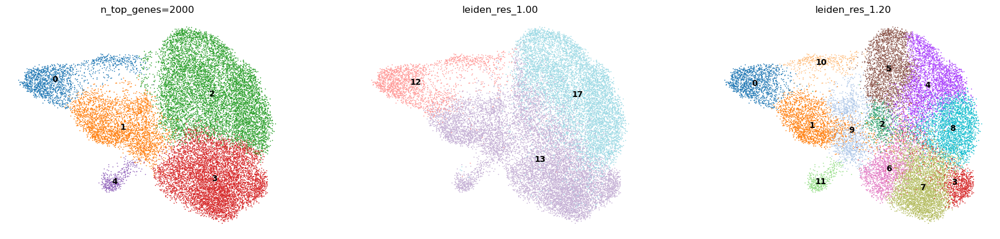

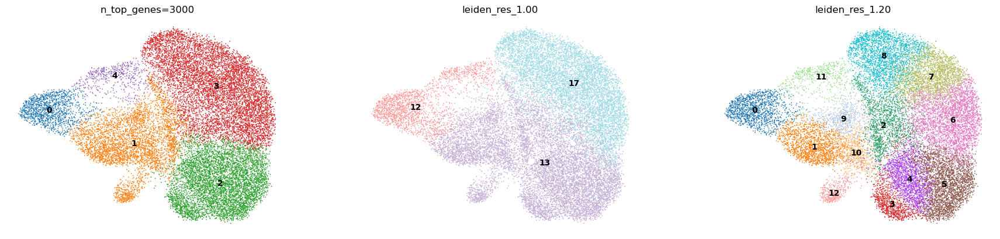

In [254]:
n_genes_list = [2000,3000] #, 2000, 3000
resolutions = np.arange(0.4, 1.21, 0.4)

for n in n_genes_list:
    # 1. 高变基因选择
    sc.pp.highly_variable_genes(adata_Endo, n_top_genes=n)
    
    # 2. 降维和批次校正
    sc.tl.pca(adata_Endo)
    sc.pp.neighbors(adata_Endo)
    sc.external.pp.bbknn(adata_Endo, batch_key='sample')  # 批次校正
    
    # 3. UMAP降维
    sc.tl.umap(adata_Endo)
    
    # 4. 不同分辨率聚类
    for res in resolutions:
        # 执行Leiden聚类
        cluster_key = f"leiden_res_{res:.2f}"  # 保留两位小数
        sc.tl.leiden(
            adata_Endo, 
            key_added=cluster_key, 
            resolution=res, 
            flavor="igraph"
        )
    
    # 5. 可视化特定分辨率的结果
    # 选择要可视化的分辨率（0.4, 1.0, 1.2）
    selected_res = ["leiden_res_0.40", "leiden_res_1.00", "leiden_res_1.20"]
    
    # 创建UMAP图
    sc.pl.umap(
        adata_Endo, 
        color=selected_res,
        title=f'n_top_genes={n}',
        ncols=3,  # 分三列显示
        frameon=False,
        legend_loc='on data',  # 图例显示在图上
        show=False  # 不立即显示，便于后续保存
    )
    

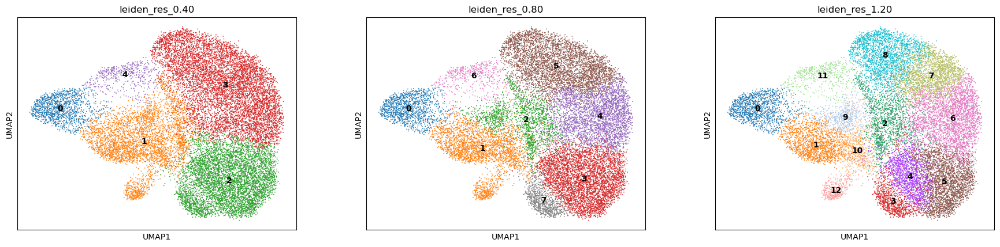

In [256]:
sc.pl.umap(
    adata_Endo,
    color=["leiden_res_0.40","leiden_res_0.80",  "leiden_res_1.20"],
    legend_loc="on data",
) 

In [ ]:
adata_B.write("./adata_B.h5ad")

In [242]:
Bmarker_genes = { 
    'B naive' :["TCL1A","IGHD"],
    'B memory' :["CD27","TNFRSF13B","IGHM"],
    "germinal center B":["CD38", "LRMP", "SUGCT", "MME", "MKI67", "AICDA"], #"S1PI2",
    "ASC" :['SDC1', 'PRDM1', 'JCHAIN',"TXNDC5","NME2","PPIB"],
    "Cycling B":['MKI67', 'TOP2A', 'PCNA'],
                               'B atypical' :["FGR","FCRL5","FCRL3","ITGAX"] }

In [268]:
Endo_marker_genes = { 
    "Artery": ['EFNB2', 'GJA5', 'DLL4',"CXCL12","GJA4","SRGN" ],  
    "Capillary": ['CLDN5', 'RGCC',"TXNIP","CA4","PLVAP","SOCS3" ], 
    "Venous":['EPHB4', 'NR2F2', "ACKR1","POSTN","SELE","CCL14","SELP"],  
    "Tip": ['KDR', 'ANGPT2',"FLT1","INSR","PGF","ANGPT2"],  #'APLN',
    "Immature": ["APLNR",'ANGPT2',"ID1","ENG",'CD34', 'PROM1', 'MKI67'],  
    "LEC": ['LYVE1', 'PDPN',"PROX1","CCL21","TFF3"],  
    "Other":["ISG15","ISG20","CXCL10"] }  #"KRT17",


In [264]:
Endo_marker_genes.keys()

dict_keys(['Artery', 'Capillary', 'Venous', 'Tip', 'Immature', 'LEC', 'Other'])

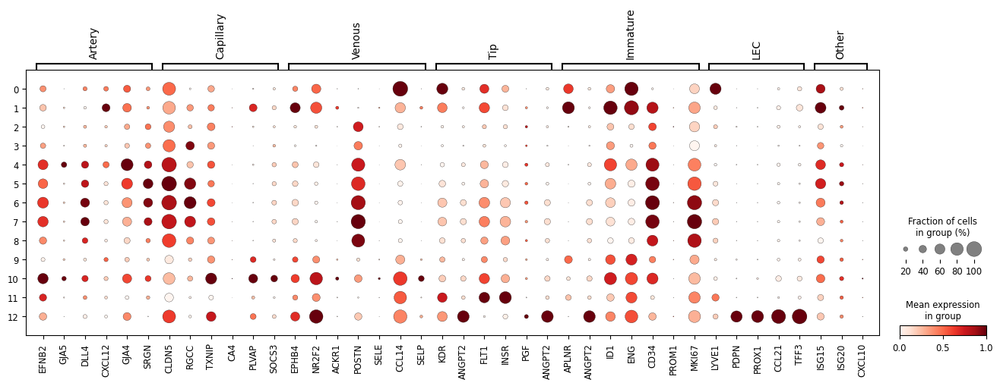

In [271]:
sc.pl.dotplot(adata_Endo, Endo_marker_genes, groupby="leiden_res_1.20", standard_scale="var")

In [272]:
sc.tl.rank_genes_groups(
    adata_Endo, 
    groupby='leiden_res_1.20',  # 使用聚类结果（如leiden/louvain）
    method='wilcoxon', # 推荐方法：wilcoxon, t-test, logreg
    n_genes=100,       # 每个群保留的差异基因数
    use_raw=False,     # 是否使用raw数据（推荐False）
    key_added='diff_genes'  # 结果存储键名
)

# 2. 提取所有亚群的差异基因结果
diff_genes_dict = sc.get.rank_genes_groups_df(adata_Endo, group=None, key='diff_genes')


/home/jpc/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/jpc/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/jpc/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/jpc/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/jpc/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[g

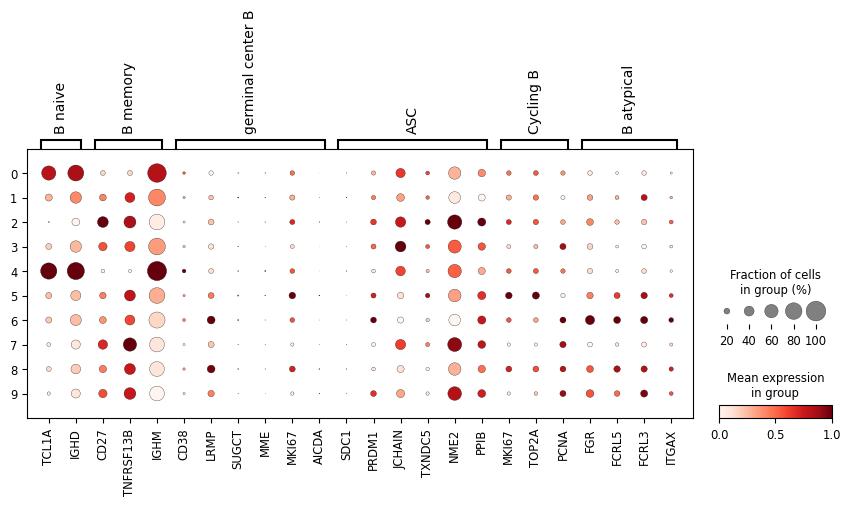

In [249]:
sc.pl.dotplot(adata_B, Bmarker_genes, groupby="leiden_res_1.20", standard_scale="var")

In [170]:
target_types = ["Myeloid cells", "Mast cells"]
adata_Mye1=adata_Mye.copy()

In [176]:
adata_Mye = adata_filtered[adata_filtered.obs["cell_type"].isin(target_types)].copy()

In [177]:
sc.pp.highly_variable_genes(adata_Mye, n_top_genes=2000)

/home/jpc/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:305: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)


In [178]:
 sc.tl.pca(adata_Mye)
#sc.external.pp.bbknn(adata_Mye, batch_key='sample')
 sc.tl.umap(adata_Mye)

In [187]:
for res in np.arange(0.4, 1.61, 0.2):
    sc.tl.leiden(
        adata_Mye1, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )

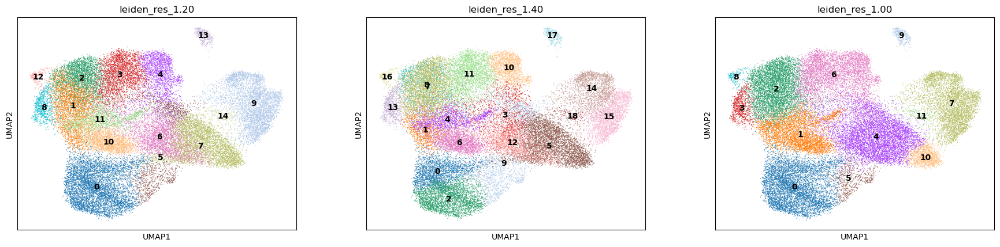

In [188]:
sc.pl.umap(
    adata_Mye1,
    color=["leiden_res_1.20","leiden_res_1.40",  "leiden_res_1.00"],
    legend_loc="on data",
) 

In [202]:
Mmarker_genes = { 
   'pDC' :['ITM2C','LILRA4','MZB1'],
                            #'ASDC' :['AXL','SIGLEC6','CD22'],
  #  "mDC"  :["LAMP3", "CCR7", "CD40", "CD83", "IDO1", "CCL19", "CCL22"],
                            'cDC1' :['CLEC9A','THBD','BATF3'],
                            'cDC2' :['CLEC10A','FCER1A','CD1C'],
 'cDC3' :['FCGR3A','LAMP3', 'IDO1','IDO2'],
                            'CD14+mono' :['CD14','CSF3R','S100A8','S100A9'],
                            'CD16+mono' :['FCGR3A','CDKN1C','CX3CR1'], #'CD16'=FCGR3A
    #"Neutro" :["FCGR3B", "CXCR2", "SLC25A37", "G0S2", "CXCR1", "ADGRG3"],
    "Mast cells":["TPSAB1","CPA3","MS4A2","KIT"],
 "M1_Macrophages": ["CD68","CD80", "CD86", "HLA-DRA", "IL1B", "TNF"],#, "NOS2"
    "M2_Macrophages": [ "MRC1","CD163", "MSR1", "ARG1", "IL10"],
    #"TAM_Anti-inflammatory": ["SPP1", "APOE", "TREM2", "CD163", "VEGFA"],
   # "TAM_Pro-angiogenic": ["VEGFA", "ADM", "HIF1A"],
   # "Microglia": ["TMEM119", "P2RY12", "CX3CR1"],
        "Kupffer_Cells": ["CLEC4F", "ID1", "VSIG4", 'TIMD4', 'SPIC'] # 'CD5l',
}

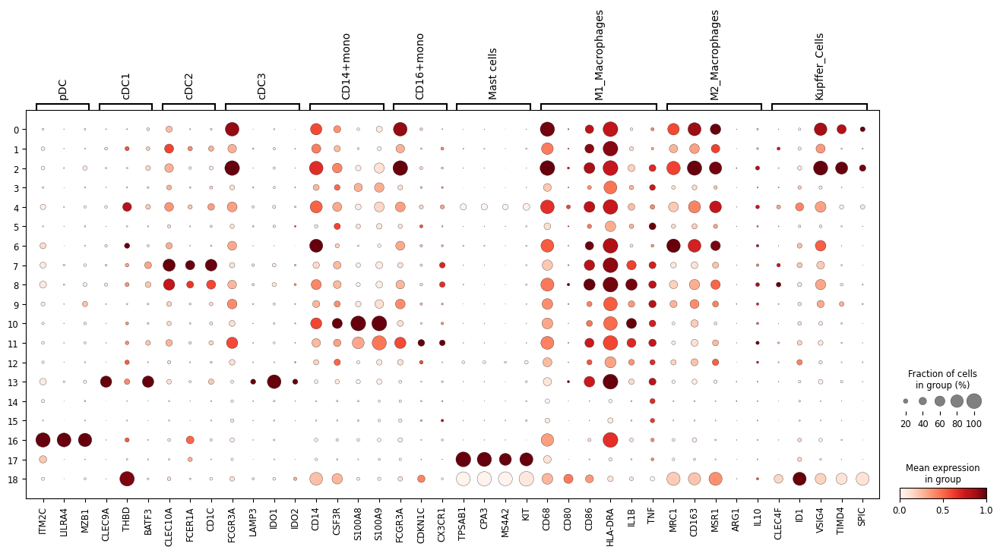

In [203]:
sc.pl.dotplot(adata_Mye1, Mmarker_genes, groupby="leiden_res_1.40", standard_scale="var")

In [222]:
granulocyte_markers = {
    'Neutrophil': ['S100A8', 'S100A9', 'FCGR3B', 'CXCR2'],
    'Eosinophil': ['IL5RA', 'RNASE2', 'PRG2'],
    'Basophil': ['FCER1A', 'IL3RA', 'MS4A2', 'ENPP3'],
    'Mast_Cell': ['KIT', 'TPSAB1', 'CPA3', 'HDC'],
    'Gran_Progenitor': ['CD34', 'MPO', 'AZU1']
}

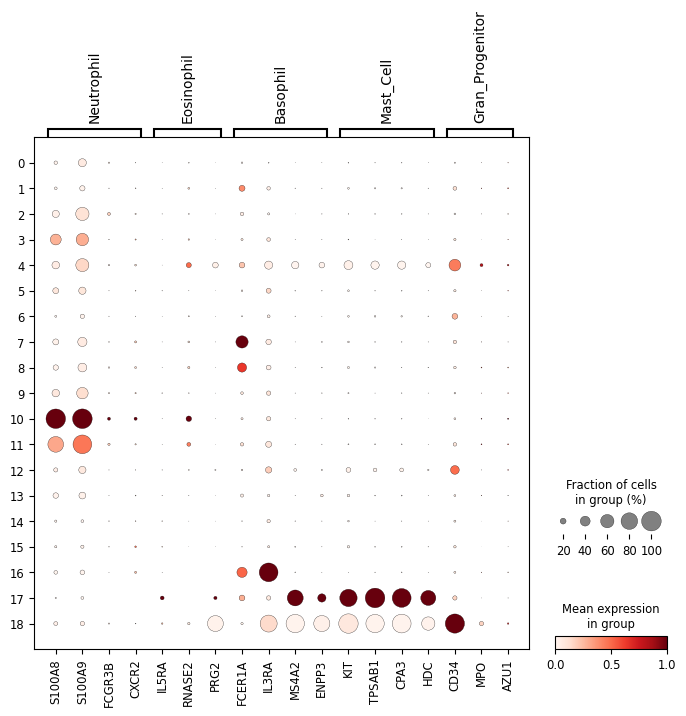

In [223]:
sc.pl.dotplot(adata_Mye1, granulocyte_markers, groupby="leiden_res_1.40", standard_scale="var")

In [199]:

# 1. 执行差异表达分析（关键步骤）
sc.tl.rank_genes_groups(
    adata_Mye1, 
    groupby='leiden_res_1.40',  # 使用聚类结果（如leiden/louvain）
    method='wilcoxon', # 推荐方法：wilcoxon, t-test, logreg
    n_genes=100,       # 每个群保留的差异基因数
    use_raw=False,     # 是否使用raw数据（推荐False）
    key_added='diff_genes'  # 结果存储键名
)

# 2. 提取所有亚群的差异基因结果
diff_genes_dict = sc.get.rank_genes_groups_df(adata_Mye1, group=None, key='diff_genes')


/home/jpc/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/jpc/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/jpc/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/jpc/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/jpc/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[g

In [224]:
import gc
del adata_Mye
gc.collect()

16799

In [206]:
# 3. 转换为按亚群分组的DataFrame
import pandas  as pd
diff_genes_by_cluster = {}
for cluster in adata_Mye1.obs['leiden_res_1.40'].cat.categories:
    cluster_df = sc.get.rank_genes_groups_df(adata_Mye1, group=cluster, key='diff_genes')
    cluster_df['cluster'] = cluster  # 添加群标签
    diff_genes_by_cluster[cluster] = cluster_df

# 4. 合并所有结果
all_diff_genes = pd.concat(diff_genes_by_cluster.values())

In [230]:
all_diff_genes.to_csv("diff_Myeloid.csv")

In [231]:
adata_Mye1.write("adata_Mye1.h5ad")

In [207]:
all_diff_genes.head(10)

,names,scores,logfoldchanges,pvals,pvals_adj,cluster
0,FTL,73.658127,4.362326,0.0,0.0,0
1,C1QA,73.208305,4.806261,0.0,0.0,0
2,C1QB,72.460060,4.851710,0.0,0.0,0
3,C1QC,72.293091,4.600786,0.0,0.0,0
4,CD5L,67.818939,4.859485,0.0,0.0,0
5,CTSB,64.363380,3.255315,0.0,0.0,0
6,MARCO,64.349861,5.193834,0.0,0.0,0
7,FCGRT,63.242382,3.165191,0.0,0.0,0
8,SLC40A1,63.134537,4.022292,0.0,0.0,0
9,CD63,62.923698,7.015584,0.0,0.0,0


In [212]:
all_diff_genes['cluster'].value_counts()

cluster
0     100
10    100
17    100
16    100
15    100
14    100
13    100
12    100
11    100
9     100
1     100
8     100
7     100
6     100
5     100
4     100
3     100
2     100
18    100
Name: count, dtype: int64

In [217]:
cluster_14_15 = all_diff_genes[ all_diff_genes['cluster'].isin(["15"])] #"14",
#cluster_14 = all_diff_genes.query('cluster == 14') #or cluster == 15')

In [211]:
all_diff_genes['cluster'].value_counts()

(0, 6)

In [228]:
adata_Mye1.obs["cell_minor"] = adata_Mye1.obs["leiden_res_1.40"].map(
    {
        "0": "Kupffer Cells",
        "1": "Macro",
        "2": "Kupffer Cells",
        "3": "CD14+ Mono",
        "4": "Macro",
        "5": "Macro",
        "6": "Macro",
        "7": "cDC2",
        "8": "cDC2",
        "9": "Macro",
        "10": "CD14+ Mono",
        "11": "CD16+ Mono",
        "12": "Macro",
        "13": "cDC1",
        "14": "Unknown",
        "15": "Unknown",
        "16": "pDC",
        "17": "Mast",
        "18":"Unknown"
    }
)

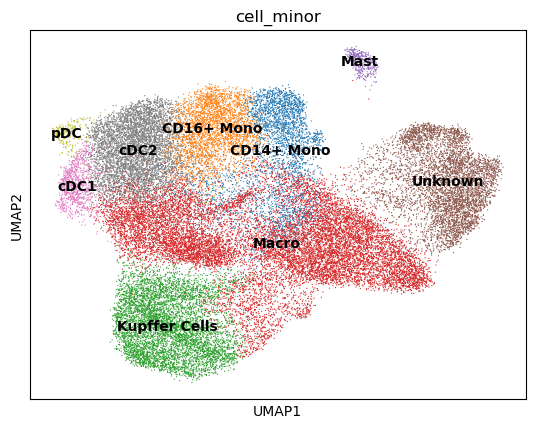

In [229]:
sc.pl.umap(  adata_Mye1, color=["cell_minor"],  legend_loc="on data")

In [150]:
adata_Mye#.obs["cell_type"].unique()

AnnData object with n_obs × n_vars = 38738 × 25365
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden_res_0.20', 'leiden_res_0.40', 'leiden_res_0.60', 'leiden_res_0.80', 'leiden_res_1.00', 'leiden_res_1.20', 'leiden_res_1.40', 'leiden_res_1.60', 'leiden_res_1.80', 'leiden_res_2.00', 'S_score', 'G2M_score', 'phase', 'leiden', 'cell_type'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variabl

In [67]:
#sc.pp.normalize_total(adata_T)
# Logarithmize the data
#sc.pp.log1p(adata_T)

/home/jpc/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


/home/jpc/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:385: RuntimeWarning: invalid value encountered in log1p
  np.log1p(X, out=X)


In [73]:
adata_T.var.index

Index(['AL627309.1', 'AL627309.5', 'LINC01128', 'AL645608.6', 'LINC01409',
       'AL390719.3', 'AGRN', 'FAM41C', 'TTLL10', 'LINC01342',
       ...
       'EIF1AY', 'AC136616.3', 'AC145212.1', 'MAFIP', 'AC011043.1',
       'AL592183.1', 'AC007325.4', 'AL354822.1', 'AC004556.3', 'AC240274.1'],
      dtype='object', length=25365)

In [75]:
#print("非零值比例:", np.count_nonzero(adata_T.X)/adata_T.X.size)

非零值比例: 1.0


In [91]:
sc.pp.highly_variable_genes(adata_T, n_top_genes=1000)

/home/jpc/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:305: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)


In [128]:
 sc.tl.pca(adata_T)
sc.external.pp.bbknn(adata_T, batch_key='sample')
 sc.tl.umap(adata_T)

In [93]:
adata_T.obs.keys

<bound method NDFrame.keys of                sample  n_genes_by_counts  log1p_n_genes_by_counts  \
CELL8_N3         HTJT               1268                 7.145984   
CELL18_N3        HTJT               1534                 7.336286   
CELL19_N3        HTJT               1590                 7.372118   
CELL31_N4        HTJT               1617                 7.388946   
CELL35_N2        HTJT               1134                 7.034388   
...               ...                ...                      ...   
CELL28431_N1-1   CYWT               2400                 7.783641   
CELL28475_N1-2   CYWT               1784                 7.487174   
CELL28502_N1-3   CYWT               2620                 7.871311   
CELL28510_N1-3   CYWT               2625                 7.873217   
CELL28519_N1-2   CYWT               1676                 7.424762   

                total_counts  log1p_total_counts  pct_counts_in_top_50_genes  \
CELL8_N3              3866.0            8.260234             

In [129]:
for res in np.arange(0.2, 1.01, 0.2):
    sc.tl.leiden(
        adata_T, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )

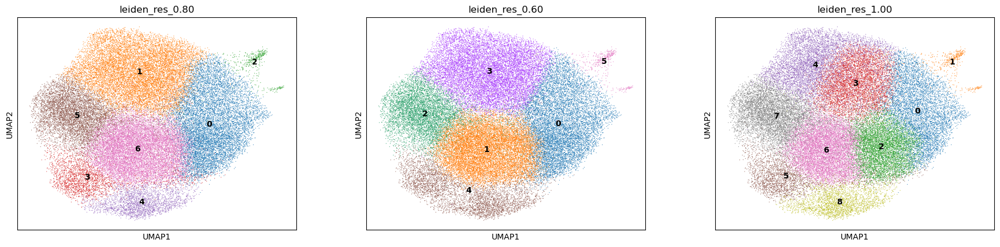

In [130]:
sc.pl.umap(
    adata_T,
    color=["leiden_res_0.80", "leiden_res_0.60", "leiden_res_1.00"],
    legend_loc="on data",
) #HVG 1000, 2000差不多

/home/jpc/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:305: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)


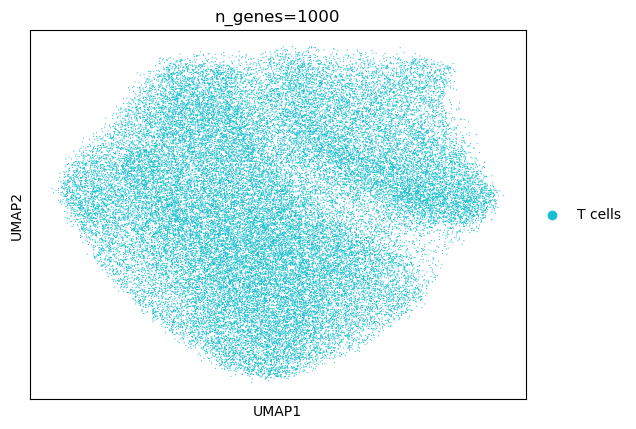

/home/jpc/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:305: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)


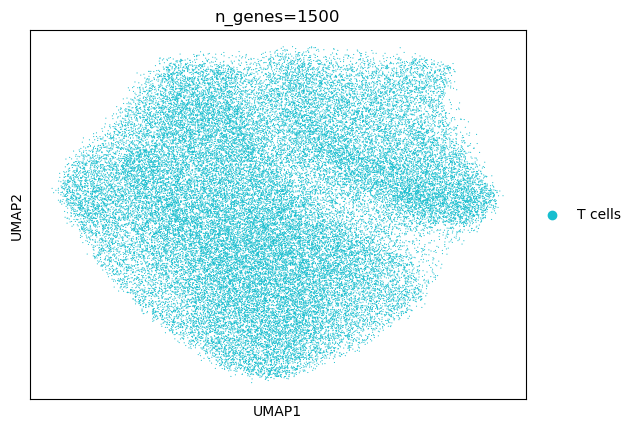

In [89]:
for n in [1000, 1500]:
    sc.pp.highly_variable_genes(adata_T, n_top_genes=n)
    sc.tl.pca(adata_T);
    sc.tl.umap(adata_T)
    sc.tl.leiden(
        adata_filtered, resolution=0.80, flavor="igraph" )
    sc.pl.umap(adata_T, color='cell_type', title=f'n_genes={n}')


In [104]:
Tmarker_genes = { 
  "CD4+": ["CD4"],
  "CD8+":["CD8A","CD8B"],
  "Treg":["FOXP3","IL2RA","TNFRSF18","LAYN"] #"CCR8",
}

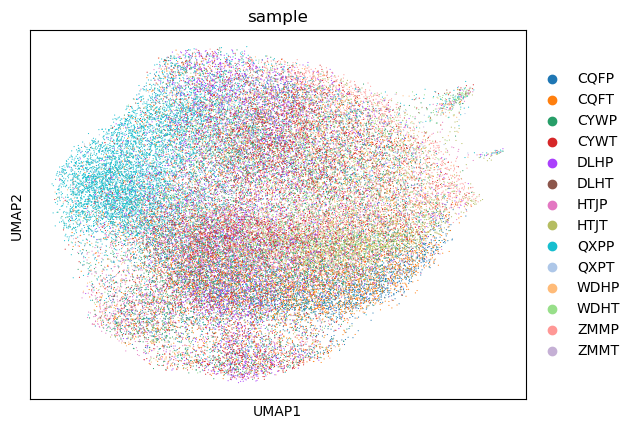

In [131]:
 sc.pl.umap(adata_T, color='sample')

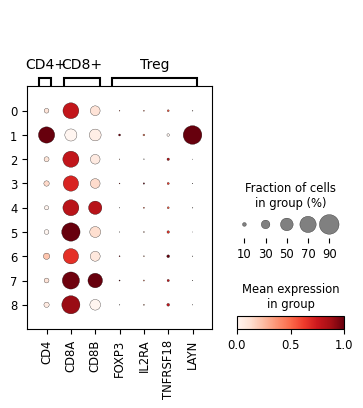

In [133]:
sc.pl.dotplot(adata_T, Tmarker_genes, groupby="leiden_res_1.00", standard_scale="var")

In [113]:
adata_T4 = adata_T[adata_T.obs["leiden_res_1.00"] == "7"].copy()

In [121]:
adata_T8 = adata_T[adata_T.obs["leiden_res_1.00"] != "7"].copy()

KeyboardInterrupt: 

/home/jpc/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:305: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)


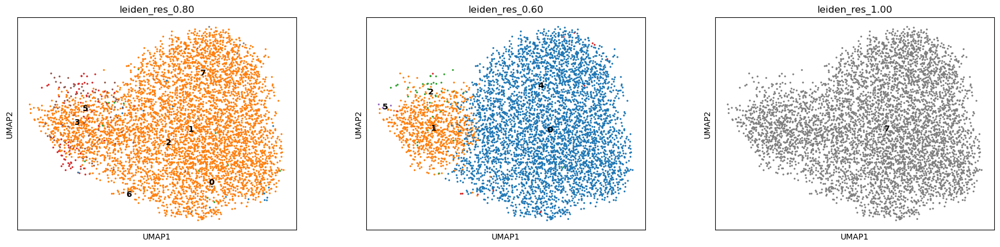

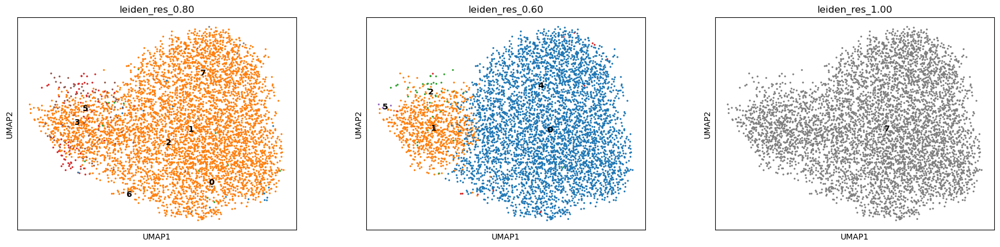

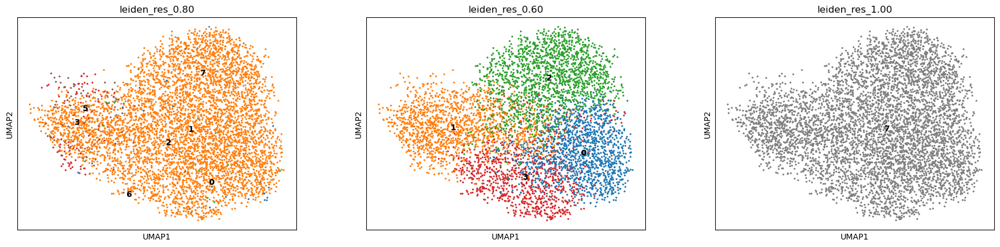

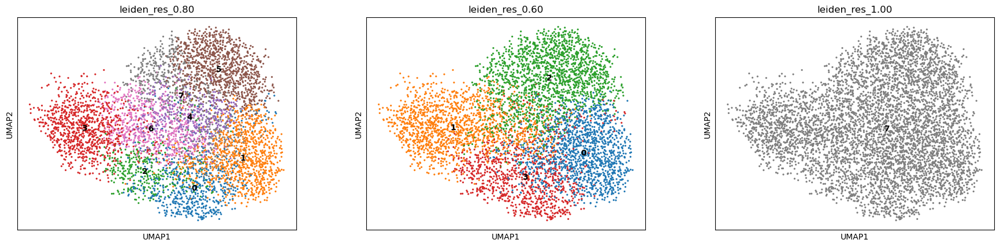

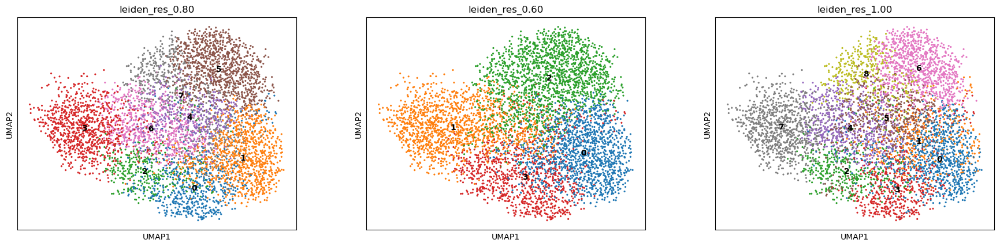

In [114]:
sc.pp.highly_variable_genes(adata_T4, n_top_genes=800)
sc.tl.pca(adata_T4)
sc.tl.umap(adata_T4)
for res in np.arange(0.2, 1.01, 0.2):
    sc.tl.leiden(
        adata_T4, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )
    sc.pl.umap(
    adata_T4,
    color=["leiden_res_0.80", "leiden_res_0.60", "leiden_res_1.00"],
    legend_loc="on data",
)

In [118]:
T4_markers = {
    "CD4+ Tn":["CCR7", "SELL", "TCF7", "IL7R", "GPR183", "LEF1", "LTB"],
 "CD4+ Tcm":["CCR7", "HSPA6", "MT1E", "MT1F", "CLDND1", "CD69", "GPR183", "IL7R", "KLF2", "TOB1"],
"CD4+ Tem":["RPS19", "DUSP2", "CD44"],
"Th1":["UCP2",  "TBX21", "IFNG"], #"APCB1B",
"Th17":["LINC00513", "AC016831.7", "ADAM19", "RORA", "IL17A",  "RORC", "IL23R", "CTSH"], #, "CAGC" "XIST",
"Tfh":["CXCL13", "CTLA4",  "PDCD1", "ICOS", "TNFRSF8", "BCL6", "TOX"], #"BATE",
"Treg":["FOXP3", "IL2RA", "CTLA4", "TIGIT", "TNFRSF18", "MAGEH1", "SAT1",  "IL10", "BATF"] } # "CCR8","KZF2",

#'APCB1B', 'BATE', 'CAGC', 'CCR8', 'IL17F', 'KZF2', 'XIST'

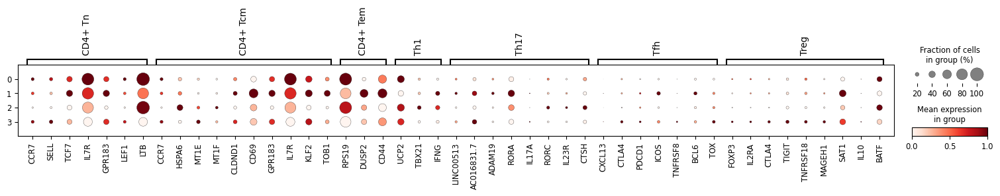

In [120]:
sc.pl.dotplot(adata_T4, T4_markers, groupby="leiden_res_0.60", standard_scale="var")

In [124]:
cell_markers = {
    "Naive T cells": ["CCR7", "SELL", "S100A8", "CST3", "AC020916.1", "IL7R", "LEF1", "TCF7"],
    "Central Memory T cells": ["RPS26", "GZMK", "CD44", "EOMES", "CD28", "CCR7", "DKK3"], #"CLND1",
    "Effector Memory T cells": ["DUSP2", "GZMK", "CX3CR1"],
    "Teff": ["FGFBP2", "CX3CR1", "FCGR3A", "IFNG", "GZMB", "GZMH", "PRF1", "NKG7", "GNLY"], #"XLRG1",
    "Trm": ["XCL1", "XCL2", "IL7R", "PRDM1", "TGFBR2", "ITGAL"],
    "Tex": ["CXCL13", "TIGIT", "CTLA4", "PDCD1", "LAG3", "HAVCR2", "ENTPD1", "TOX", "TOX2", "LAYN", "TNFRSF9"],
    "Temma": ["FGFBP2", "ADGRG1", "FCGR3A"],
    "Cytotoxic": ["NKG7", "PRF1", "GZMK", "GZMA", "GZMB", "GZMH", "IFNG"],
    "TSTR": ["HSPA1A", "HSPA1B"],
    "TSEN": [],
    "p-TEX": ["TCF7", "CD27", "CD28", "EOMES"]
}
# 'CLND1', 'XLRG1'
# low_expression_genes = {
  #  "Trm": ["S1PR1", "CCR7", "SELL"],
#    "Tex": ["TCF7"],
#    "TSEN": ["CD27"] }

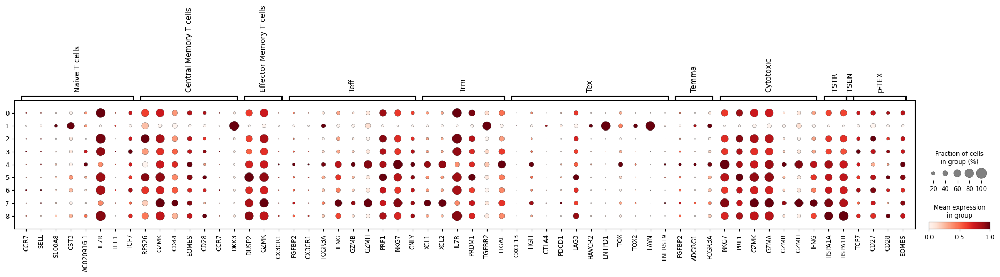

In [134]:
sc.pl.dotplot(adata_T, cell_markers, groupby="leiden_res_1.00", standard_scale="var")